#### EE0005: Introduction to Data Science and Artificial Intelligence - Mini Project
# Is it possible to predict whether an individual will win a medal or not in their respective sports at the Summer Olympics?
* Tutorial Group: SC01
* Group: Hello World 
* Members: 
    1. Goh Sheue Ling(U1922525B), 
    2. Ng Woon Ting Elizabeth(U1920495g), 
    3. Wang Jia Rui(U1922794B)

Dataset Downloaded from Kaggle : 120 years of Olympic history: athletes and results
Source: https://www.kaggle.com/heesoo37/120-years-of-olympic-history-athletes-and-results


# Introduction
This is a historical dataset on the modern Olympic Games, including all the Games from Athens 1896 to Rio 2016.

Our aim of the project is to find out if it is possible to use the chosen dataset to predict whether an individual can win a medal at the olympics. The project includes analysis of which combinations of variables and approach will be able to succesfully make predictions through machine learning.

# Section A: Cleaning of Data 
(Done By: Goh Sheue Ling)

In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics
%matplotlib inline

# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.tree import export_graphviz
from sklearn import metrics
from sklearn import preprocessing

import plotly.express as px
import graphviz

import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools

# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)

In [2]:
#Import File athlete_events.csv
#Import File noc_regions.csv
athleteData = pd.read_csv('athlete_events.csv')
noc_country = pd.read_csv('noc_regions.csv')

### Extracting Data

In [3]:
print("Athletes and Events data -  rows:",athleteData.shape[0]," columns:", athleteData.shape[1])
print("NOC Regions data -  rows:",noc_country.shape[0]," columns:", noc_country.shape[1])

Athletes and Events data -  rows: 271116  columns: 15
NOC Regions data -  rows: 230  columns: 3


In [4]:
# Check for summer and winter sports
print(athleteData["Season"].dropna().value_counts())

Summer    222552
Winter     48564
Name: Season, dtype: int64


In [5]:
# Create a pandas dataframe with summer data only for cleaning
athletedata_clean = pd.DataFrame(athleteData.loc[(athleteData['Season'] == "Summer"), :])

#Check for sports season
print(athletedata_clean["Season"].dropna().value_counts())

Summer    222552
Name: Season, dtype: int64


### Checking for Missing Data

In [6]:
# Check missing values in data
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data(athletedata_clean)


,Total,Percent
Medal,188464,84.683130
Weight,53854,24.198390
Height,51857,23.301071
Age,9189,4.128923
Event,0,0.000000
Sport,0,0.000000
City,0,0.000000
Season,0,0.000000
Year,0,0.000000
Games,0,0.000000


In [7]:
# Check information for Dataset to be cleaned
athletedata_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 222552 entries, 0 to 271110
Data columns (total 15 columns):
ID        222552 non-null int64
Name      222552 non-null object
Sex       222552 non-null object
Age       213363 non-null float64
Height    170695 non-null float64
Weight    168698 non-null float64
Team      222552 non-null object
NOC       222552 non-null object
Games     222552 non-null object
Year      222552 non-null int64
Season    222552 non-null object
City      222552 non-null object
Sport     222552 non-null object
Event     222552 non-null object
Medal     34088 non-null object
dtypes: float64(3), int64(2), object(10)
memory usage: 27.2+ MB


In [8]:
# Check the Variable Information

print(athletedata_clean["Medal"].value_counts())

Gold      11459
Bronze    11409
Silver    11220
Name: Medal, dtype: int64


## Data Cleaning 

From the data above,it seems that there are quite a lot of empty data on age, height, weight and medal.

In [9]:
# Fill missing values in data
athletedata_clean.loc[:,("Medal")].fillna(value = "NoMedal", inplace = True)

#Check that NaN values have been replaced with "NoMedal"
athletedata_clean.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NoMedal
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NoMedal
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NoMedal
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NoMedal


In [10]:
# Check to ensure the 
print(athletedata_clean["Medal"].dropna().value_counts())

NoMedal    188464
Gold        11459
Bronze      11409
Silver      11220
Name: Medal, dtype: int64


Filling in empty numerical data based on their individual mean

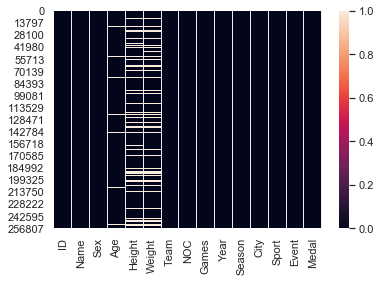

In [11]:
# Visualise missing data in heatmap
sb.heatmap(athletedata_clean.isnull())
# Empty mising data present in columns: Age Height Weight

Age   : Missing Data = 4.13% < 15%    (Filled in the missing data with mean value)
<br>Height: Missing Data = 23.3% > 15%    (Remove missing values)
<br>Weight: Missing Data = 24.2% > 15%    (Remove missing values)

In [12]:
#Stats for Age
#plt.figure(figsize=(12, 7))
#sb.boxplot(x='Sex',y='Age',data=athletedata_clean,palette='winter')
acf = athletedata_clean.loc[(athletedata_clean['Sex'] == 'F'), :]
acf.describe()

,ID,Age,Height,Weight,Year
count,59443.000000,59026.000000,53856.000000,53438.000000,59443.000000
mean,69650.260788,23.660997,168.169025,60.087644,1991.897616
std,39009.551405,6.043343,9.312757,10.856051,21.078455
min,8.000000,11.000000,127.000000,25.000000,1900.000000
25%,35926.000000,19.000000,162.000000,53.000000,1980.000000
50%,70070.000000,23.000000,168.000000,59.000000,1996.000000
75%,103154.000000,27.000000,174.000000,66.000000,2008.000000
max,135568.000000,74.000000,213.000000,167.000000,2016.000000


In [13]:
acm = athletedata_clean.loc[(athletedata_clean['Sex'] == 'M'), :]
acm.describe()

,ID,Age,Height,Weight,Year
count,163109.000000,154337.000000,116839.000000,115260.000000,163109.000000
mean,67397.117651,26.443944,178.901874,75.604195,1970.638971
std,39168.935599,6.778277,9.885502,13.778914,31.996313
min,1.000000,10.000000,127.000000,28.000000,1896.000000
25%,33315.000000,22.000000,172.000000,66.000000,1952.000000
50%,67461.000000,25.000000,179.000000,74.000000,1976.000000
75%,101470.000000,29.000000,185.000000,83.000000,1996.000000
max,135567.000000,97.000000,226.000000,214.000000,2016.000000


In [14]:
#Box Plot Showing Male&Female age data
trace0 = go.Box(x = acf['Age'], showlegend = False, name = "Female Age",boxmean=True)
trace1 = go.Box(x = acm['Age'], showlegend = False, name = "Male Age",boxmean=True)

data = [trace0, trace1]
py.iplot(data)

In [15]:
# Fill in missing Age data
def impute_age(cols):
    Age = cols[0]
    Sex = cols[1]
    
    if pd.isnull(Age):
        if Sex == 'M':
                    return 25.707376
        elif Sex == 'F':
                    return 23.652877
    else:
        return Age

In [16]:
athletedata_clean['Age'] = athletedata_clean[['Age','Sex']].apply(impute_age,axis=1)

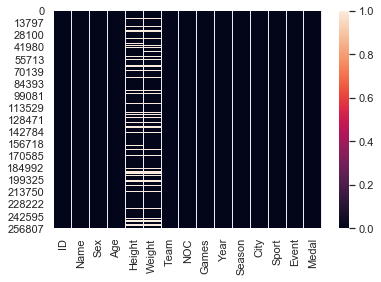

In [17]:
# Visualise missing data in heatmap
sb.heatmap(athletedata_clean.isnull())

As number of missing age is lesser and by filling up the missing data with mean will not greatly affect the statistic of the data.

In [18]:
# Drop Empty Height and Weight
athletedata_clean = athletedata_clean.dropna()

# Visualise missing data
athletedata_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 167361 entries, 0 to 271110
Data columns (total 15 columns):
ID        167361 non-null int64
Name      167361 non-null object
Sex       167361 non-null object
Age       167361 non-null float64
Height    167361 non-null float64
Weight    167361 non-null float64
Team      167361 non-null object
NOC       167361 non-null object
Games     167361 non-null object
Year      167361 non-null int64
Season    167361 non-null object
City      167361 non-null object
Sport     167361 non-null object
Event     167361 non-null object
Medal     167361 non-null object
dtypes: float64(3), int64(2), object(10)
memory usage: 20.4+ MB


Empty Height and Weight data are removed. Data without Height and Weight are less useful in out project and filling in the missing data with the respective mean will be affecting its standard deviation.

# Section B: Data Preparation and Exploratory Analysis
(Done by: Wang Jia Rui)

## Consolidate All Raw Data

In `athletedata_merge`, the column `Team` is to represent the respective participating country by merging file `noc_regions.cvs` based on `NOC`.

In [19]:
# Open noc_country and remove unused column
noc_country = pd.read_csv('noc_regions.csv')
noc_country.drop('notes', axis = 1 , inplace = True)

# Change region to Country
noc_country.rename(columns = {'region':'Country'}, inplace = True)

# Merge Country with Team according to NOC
athletedata_merge = athletedata_clean.merge(noc_country, 
                                            left_on = 'NOC', 
                                            right_on = 'NOC', 
                                            how = 'left')
athletedata_merge.loc[athletedata_merge['Country'].isnull(),['NOC', 'Team']].drop_duplicates()

# Change Teams from the same country but with different name to the same country name
athletedata_merge['Country'] = np.where(athletedata_merge['NOC']=='SGP', 'Singapore', athletedata_merge['Country'])
athletedata_merge['Country'] = np.where(athletedata_merge['NOC']=='ROT', 'Refugee Olympic Athletes', athletedata_merge['Country'])
athletedata_merge['Country'] = np.where(athletedata_merge['NOC']=='UNK', 'Unknown', athletedata_merge['Country'])
athletedata_merge['Country'] = np.where(athletedata_merge['NOC']=='TUV', 'Tuvalu', athletedata_merge['Country'])

# Replace 'Team' column with the pariticipating country
athletedata_merge.drop('Team', axis = 1, inplace = True)
athletedata_merge.rename(columns = {'Country': 'Team'}, inplace = True)
adm = athletedata_merge


## Exploratory Data Analysis

## 1. Classify Data

### 1.1 Classify the medal won to True/False

* Add new column `Medal_Won` represent medal won by each individual with `0` for no medal won and `1` for acheiving either Gold, Silver or Bronze.
* Sum up the total medal won for each sport into `meadl_sport`.

In [20]:
# Add new column to classify all medal obtain as win (1) and no medal win as lose (0)
adm['Medal_Won'] = np.where(adm.loc[:,'Medal'] == 'NoMedal', 0, 1)

# rows where medal_won is 1
medal_mask = adm['Medal_Won'] == 1

medal_tally_agnostic = adm.\
groupby(['Year', 'Team', 'Sport', 'Medal'])[['Medal_Won']].\
agg('sum').reset_index()

# Medal Tally
medal_tally_team = medal_tally_agnostic.groupby(['Year','Team'])['Medal_Won'].agg('sum').reset_index()
medal_tally = medal_tally_agnostic.groupby(['Year','Sport'])['Medal_Won'].agg('sum').reset_index()
medal_tally_pivot = pd.pivot_table(medal_tally,
                     index = 'Sport',
                     columns = 'Year',
                     values = 'Medal_Won',
                     aggfunc = 'sum',
                     margins = True).sort_values('All', ascending = False)

medal_sport = medal_tally_pivot.loc[:,'All']

### 1.2 Extract list of sports

* Extract Sports with more than 300 medal won into list 'sportslist'

In [21]:
extract_medal_tally = pd.DataFrame(medal_sport)
sportslist=[]
for i in extract_medal_tally.index[1:]:
    if extract_medal_tally.All[i]>300:
        sportslist.append(i)

### 1.3 Map the hosting city to country

* Change all the hosting city in `City` to country , in order to match with the participation country.
* Match `city` with `Team` to find if they are playing on their home ground.
* Create new column `Homeground_Advantage`, `1` for playing on homegreoud and `0` for not playing on homeground.

In [22]:
# city to country mapping dictionary
city_to_country = {'Tokyo': 'Japan',
                  'Mexico City': 'Mexico',
                  'Munich': 'Germany',
                  'Montreal': 'Canada',
                  'Moskva': 'Russia',
                  'Los Angeles': 'USA',
                  'Seoul': 'South Korea',
                  'Barcelona': 'Spain',
                  'Atlanta': 'USA',
                  'Sydney': 'Australia',
                  'Athina': 'Greece',
                  'Beijing': 'China',
                  'London': 'UK',
                  'Rio de Janeiro': 'Brazil',
                  'Paris': 'France',
                  'St. Louis': 'USA',
                  'Stockholm': 'Sweden',
                  'Antwerpen': 'Belgium',
                  'Amsterdam': 'Netherlands',
                  'Berlin': 'Germany',
                  'Helsinki': 'Finland',
                  'Roma': 'Italy'}

# Map cities to countries
adm['Country_Host'] = adm['City'].map(city_to_country)

#Add a column to indicate if teams had homeground advantage
adm["Homeground_Advantage"]=np.where(adm['Country_Host'] == adm['Team'],1, 0)

Data description (features):

| Column Name | Data Type | Unit |
|------|------|------|
| ID | int64 | Unique number to each participant |
| Name | Object | Name of participant |
| Sex | object | M: male, F: female | 
| Age | float64 | Years |
| Height | float64 | cm |
| Weight | float64 | kg 
| NOC | object | Short form for country |
| Games | object | Year & Summer/Winter |
| Year | int64 | - |
| Season | object | Summer/Winter |
| City | object | Hosting city |
| Sport | object | - |
| Event | object | Sub category of Sport |
| Medal | object | Gold/Silver/Bronze |
| Team | object | Participating Country |
| Medal_Won | int32 | 0: No medal won, 1: Won a medal |
| Country_Host | object | Hosting country |
| Homeground_Advantage | int32 | 0: Not playing on homeground, 1: Playing on homeground |

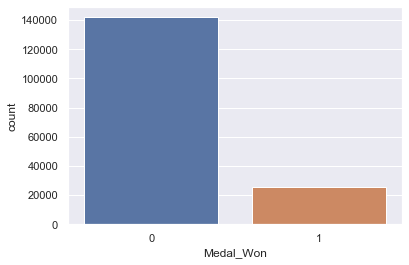

In [23]:
# Distribution of Medal_Won
sb.countplot(x = 'Medal_Won', data = adm)
#plt.savefig('medalwon.png')

When the two outcome of a dataset differs greatly, the dataset is consider as the imbalanced data. In the case if we only have the sample data for the whole population, balancing the data is needed to account for the sample bias which is to make the sample data more closely represents the actual population.

However, in our current case, we have the data for almost all the Olympics participant. Which means we do have the data for the whole Olympics sports population, and the imbalance in the dataset represent the population. Since our data do represent the disturbution of the whole population, balancing the data will negatively impact and causing bias in our algorithm.

**Conclusion:** We decided to keep the data as what it is, continoue without balancing it.

**Note:** We have tried to balance the data to see how it will look like. Code will be shown below.

## 2. Relationship Between Variables And Medal Won

### 2.1 Distribution Of Numerical Variables

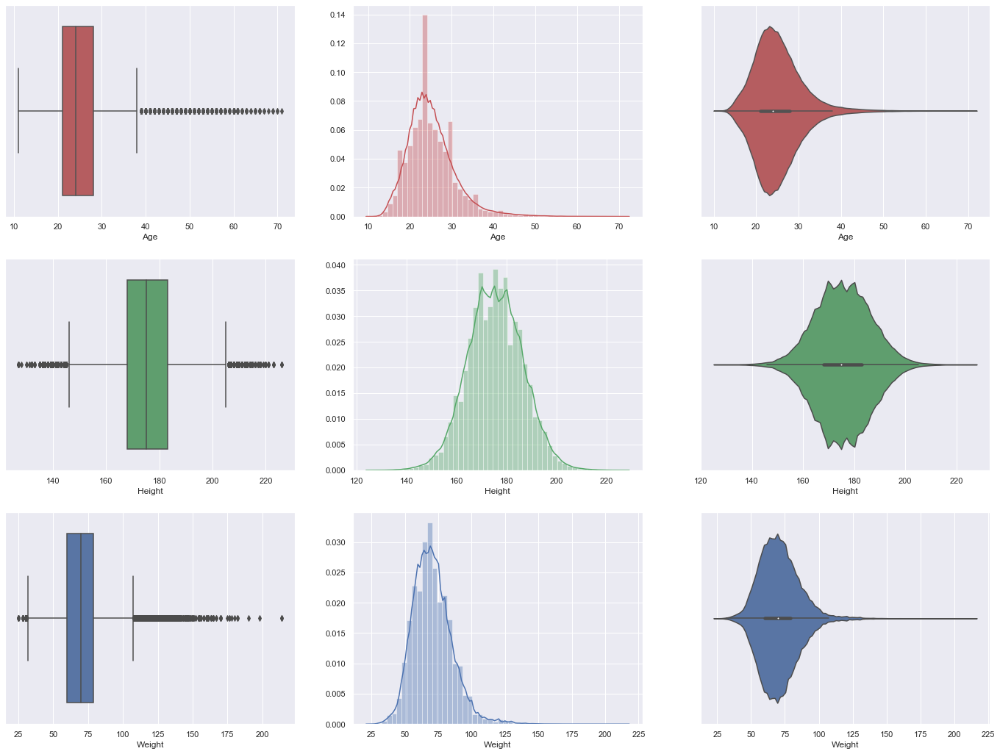

In [24]:
# Extract numerical variable from 'adm'
admnumeric = pd.DataFrame(adm[['Age', 'Height', 'Weight']])

# Plot the distributions of all variables
f, axes = plt.subplots(3, 3, figsize=(24, 18))
colors = ["r", "g", "b"]
count = 0
for var in admnumeric:
    sb.boxplot(admnumeric[var], orient = "h", color = colors[count], ax = axes[count,0])
    sb.distplot(admnumeric[var], color = colors[count], ax = axes[count,1])
    sb.violinplot(admnumeric[var], color = colors[count], ax = axes[count,2])
    #plt.savefig('admnumeric.png')
    count += 1

* The numerical datas generally have a normal distribution.
* Outliers are present for all 3 vairables.
    * There is around 200000 data that is included for this project. Presents of some outliers are acceptable.
    * The data are collected from varies sports with different forcus, which may cause the different requirement for each variable.
* All 3 varibles have a very concentrated distribution.
    * Most of the participants have similar pysical conditions.
    * There is a huge number of participant age around 25 years old.
 
**Conclusion**: The distribution of the data is fine. However, due to the high concentration of the data, other varibles will be needed to give a more accurate prediction.

**Note:** Sampling of data is used when the distribution is skewed, hence, does not represent the population data correctly. However, this dataset contains all information about the population that participated in Olympic games and it is about normally distributed. Therefore, in both case, there is no need for sampling.

### 2.2 Relationship Between Numerical Variables And Medal Won

#### 2.2.1 Distribution difference in numerical variables between medal and without medal

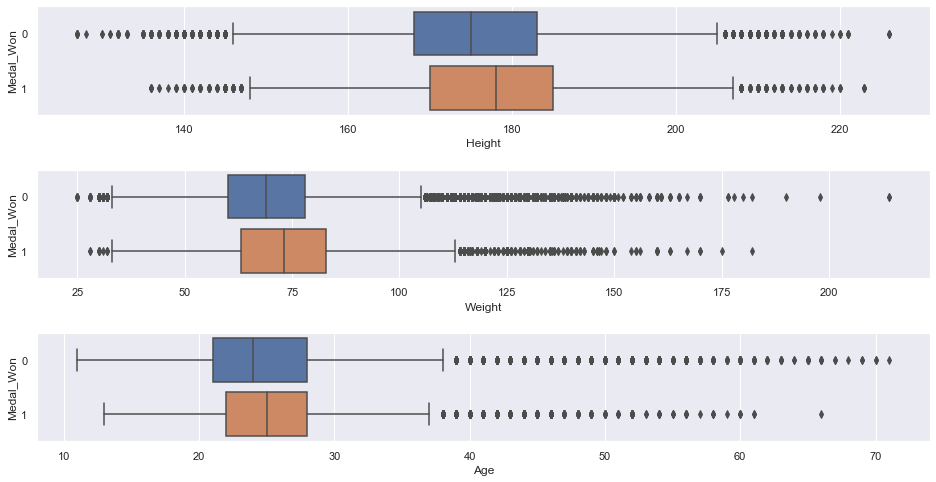

In [25]:
# Boxplots for the Features against the Clusters
f, axes = plt.subplots(3, 1, figsize=(16,8))
sb.boxplot(x = 'Height', y = 'Medal_Won', orient = "h", data = adm, ax = axes[0])
sb.boxplot(x = 'Weight', y = 'Medal_Won', orient = "h", data = adm, ax = axes[1])
sb.boxplot(x = 'Age', y = 'Medal_Won', orient = "h", data = adm, ax = axes[2])
plt.subplots_adjust(hspace=.5)
#plt.savefig('admboxplot.png')

There is a slight correlation between `Medal_Won` and `Height`, `Weight` and `Age`. Those who won are slightly taller heavier and older.

#### 2.2.2  Distribution difference in numerical variables between medal and without medal (Individual sport)

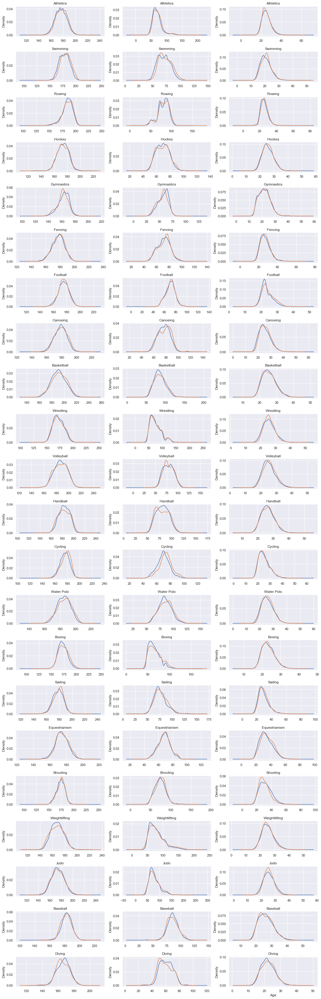

In [26]:
# Density plot for Winners in each game
stats = adm[['Height','Weight','Age','Medal_Won','Sport']]
def medalled_athletes_h(sport):
    athletes = stats[(stats['Sport']==sport)]
    athletes.groupby(['Medal_Won']).Height.plot.kde(ax = axes[count,0], title = sport, x = 'Height')
    plt.title(sport)
    plt.xlabel('Height')
    
# Density plot for Winners in each game
def medalled_athletes_w(sport):
    athletes = stats[(stats['Sport']==sport)]
    athletes.groupby(['Medal_Won']).Weight.plot.kde(ax = axes[count,1], title = sport, x = 'Weight')
    plt.title(sport)
    plt.xlabel('Weight')
    
# Density plot for Winners in each game
def medalled_athletes_a(sport):
    athletes=stats[(stats['Sport']==sport)]
    athletes.groupby(['Medal_Won']).Age.plot.kde(ax = axes[count,2], title = sport, x = 'Age')
    plt.title(sport)
    plt.xlabel('Age')

# Plot density plot for each sport
count = 0
f, axes = plt.subplots(22, 3, figsize=(18, 60))
plt.subplots_adjust(hspace=.5)
for sport in sportslist:
    medalled_athletes_h(sport)
    medalled_athletes_w(sport)
    medalled_athletes_a(sport)
    #plt.savefig('meadlleda.png')
    count+=1

There are difference in Height, Weight and Age for different sports.
* We decided to categorize the data based on sports.

However, the difference within each sports between those who won and those that did not won is not very huge. Therefore, other feature are required in order to acheive a more accurate prediction in machine learning.

### 2.3 Encode Categorical Variables

In order to observe the correlation between the categorical datas, the categorical variable and the outcome which is also categorical:
* The categorical variables have to be converted from `str` to `float` or `int`.
* Three data encoding method that provide us with a continues data are tested and one of them are choosen to explore the data.
    * Frequency Encoding
    * Weight of Evidence Encoding
    * Probability Ratio Encoding

#### 2.3.1 Frequency Encoding

,Age,Height,Weight,Homeground_Advantage,Medal_Won,Gender,Team_freq_encode,Sport_freq_encode
Age,1.000000,0.139535,0.209562,-0.018617,0.025040,0.170909,-0.003675,-0.157227
Height,0.139535,1.000000,0.795740,-0.000476,0.102504,0.448745,0.065718,-0.091163
Weight,0.209562,0.795740,1.000000,-0.003633,0.099488,0.475225,0.037549,-0.199239
Homeground_Advantage,-0.018617,-0.000476,-0.003633,1.000000,0.062662,-0.018802,0.168812,-0.011173
Medal_Won,0.025040,0.102504,0.099488,0.062662,1.000000,-0.019121,0.227321,-0.109112
Gender,0.170909,0.448745,0.475225,-0.018802,-0.019121,1.000000,-0.070083,-0.117592
Team_freq_encode,-0.003675,0.065718,0.037549,0.168812,0.227321,-0.070083,1.000000,0.004650
Sport_freq_encode,-0.157227,-0.091163,-0.199239,-0.011173,-0.109112,-0.117592,0.004650,1.000000


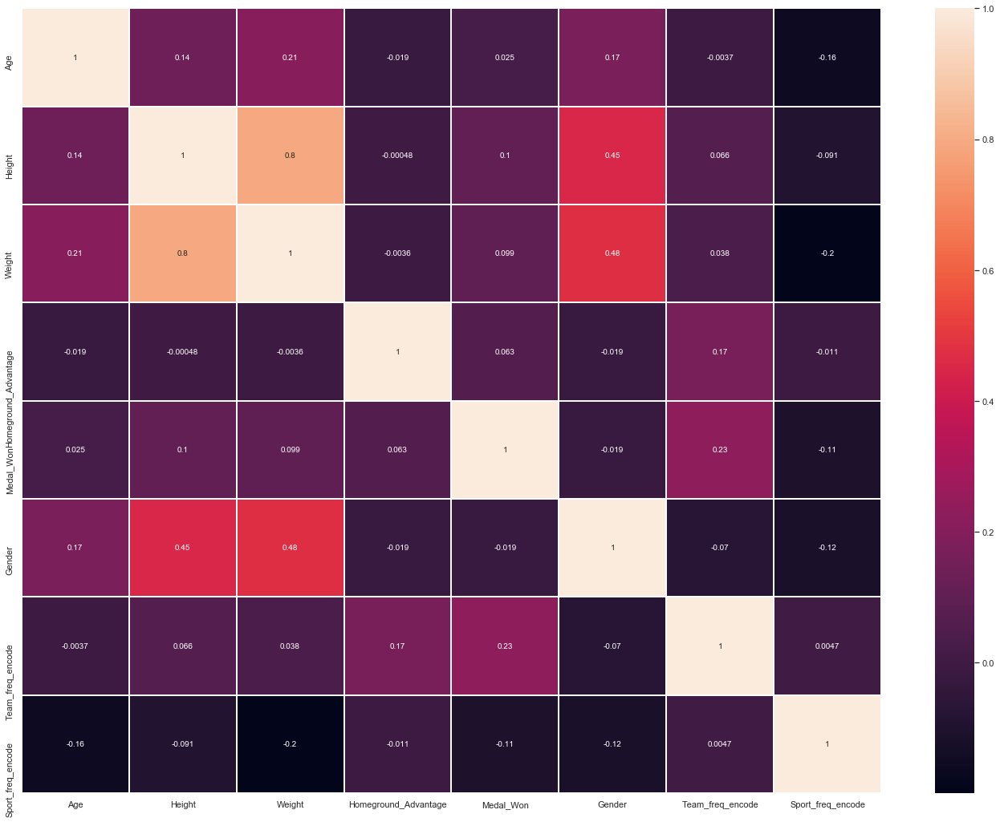

In [27]:
# Frequency Encoding
def Frequency_Encoding(cd):
    
    # Encoding for variable 'Team'
    te = cd.groupby('Team').size()/len(cd)
    cd.loc[:,'Team_freq_encode'] = cd['Team'].map(te)
    
    # Encoding for variable 'Sport'
    sp = cd.groupby('Sport').size()/len(cd)
    cd.loc[:,'Sport_freq_encode'] = cd['Sport'].map(sp)
    
    # Return encoded data as 'num_adm'
    num_adm = cd.drop(columns=['Team', 'Sport'])
    return num_adm

# Obtain data from 'adm'
corr_data = adm[['Age','Sex', 'Height', 'Weight', 'Sport', 'Team', 'Homeground_Advantage','Medal_Won']]
cdg = pd.DataFrame(corr_data[corr_data['Sport'].isin(sportslist)])
cdg["Gender"] = np.where(cdg.loc[:, ('Sex')] == 'M',1, 0)
cd = cdg.drop(columns = 'Sex')

# Plot correlation table and heatmap to show correlation
f, axes = plt.subplots(1,1, figsize=(24, 18))
fe_corrs = Frequency_Encoding(cd).corr()
ax = sb.heatmap(fe_corrs, linewidths = 1, annot = True)
bottom, top = ax.get_ylim()       
ax.set_ylim(bottom + 0.5, top - 0.5)
#plt.savefig('fe.png')
fe_corrs

It is a way to utilize the frequency of the categories as labels. 

In the cases where the frequency is related somewhat with the target variable, it helps the model to understand and assign the weight in direct and inverse proportion, depending on the nature of the data.

#### 2.3.2 Weight Of Evidence Encoding

,Age,Height,Weight,Homeground_Advantage,Medal_Won,Gender,WoE_Encode_Team,WoE_Encode_Sport
Age,1.000000,0.139535,0.209562,-0.018617,0.025040,0.170909,0.010802,0.074172
Height,0.139535,1.000000,0.795740,-0.000476,0.102504,0.448745,0.077413,0.411845
Weight,0.209562,0.795740,1.000000,-0.003633,0.099488,0.475225,0.059222,0.362277
Homeground_Advantage,-0.018617,-0.000476,-0.003633,1.000000,0.062662,-0.018802,0.091214,0.039149
Medal_Won,0.025040,0.102504,0.099488,0.062662,1.000000,-0.019121,0.187299,0.190258
Gender,0.170909,0.448745,0.475225,-0.018802,-0.019121,1.000000,-0.054918,0.070601
WoE_Encode_Team,0.010802,0.077413,0.059222,0.091214,0.187299,-0.054918,1.000000,0.041856
WoE_Encode_Sport,0.074172,0.411845,0.362277,0.039149,0.190258,0.070601,0.041856,1.000000


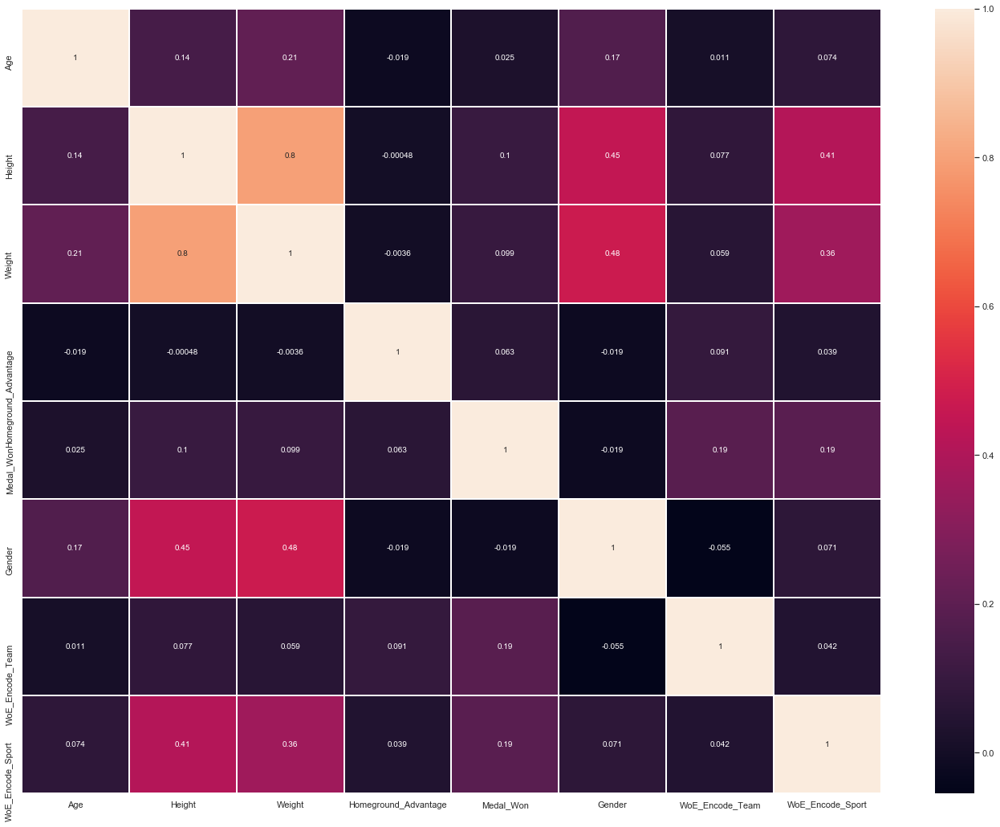

In [28]:
# Weight of Evidence Encoding
def WoE_Encoding(cd):
    
    # Encoding for variable 'Team'
    woe_cd_t = cd.groupby('Team')['Medal_Won'].mean()
    woe_cd_t = pd.DataFrame(woe_cd_t)
    woe_cd_t = woe_cd_t.rename(columns = {'Medal_Won':'Good'})
    woe_cd_t['Bad'] = 1-woe_cd_t.Good
    woe_cd_t['Bad'] = np.where(woe_cd_t['Bad'] == 0,0.00001, woe_cd_t['Bad'])
    woe_cd_t['Good'] = np.where(woe_cd_t['Good'] == 0,0.00001, woe_cd_t['Good'])
    woe_cd_t['WoE'] = np.log(woe_cd_t.Good/woe_cd_t.Bad)
    cd.loc[:,'WoE_Encode_Team'] = cd['Team'].map(woe_cd_t['WoE'])
    
    # Encoding for variable 'Sport'
    woe_cd_s = cd.groupby('Sport')['Medal_Won'].mean()
    woe_cd_s = pd.DataFrame(woe_cd_s)
    woe_cd_s = woe_cd_s.rename(columns = {'Medal_Won':'Good'})
    woe_cd_s['Bad'] = 1-woe_cd_s.Good
    woe_cd_s['Bad'] = np.where(woe_cd_s['Bad'] == 0,0.00001, woe_cd_s['Bad'])
    woe_cd_s['Good'] = np.where(woe_cd_s['Good'] == 0,0.00001, woe_cd_s['Good'])
    woe_cd_s['WoE'] = np.log(woe_cd_s.Good/woe_cd_s.Bad)
    cd.loc[:,'WoE_Encode_Sport'] = cd['Sport'].map(woe_cd_s['WoE'])
    
    # Return encoded data as 'num_adm'
    num_adm = cd.drop(columns=['Team', 'Sport']) 
    return num_adm

# Obtain data from 'adm'
corr_data = adm[['Age','Sex', 'Height', 'Weight', 'Sport', 'Team', 'Homeground_Advantage','Medal_Won']]
cdg = pd.DataFrame(corr_data[corr_data['Sport'].isin(sportslist)])
cdg["Gender"] = np.where(cdg.loc[:, ('Sex')] == 'M',1, 0)
cd = cdg.drop(columns = 'Sex')

# Plot correlation table and heatmap to show correlation
f, axes = plt.subplots(1,1, figsize=(24, 18))
woee_corrs = WoE_Encoding(cd).corr()
ax = sb.heatmap(woee_corrs, linewidths = 1, annot = True)
bottom, top = ax.get_ylim()       
ax.set_ylim(bottom + 0.5, top - 0.5)
#plt.savefig('woee.png')
woee_corrs

`WoE_Encoding` is a measure of the “strength” of a grouping technique to separate good and bad. This method was developed primarily to build a predictive model to evaluate the risk of loan default in the credit and financial industry. `WoE_Encoding` is a measure of how much the evidence supports or undermines a hypothesis.

#### 2.3.3 Probability Ratio Encoding

,Age,Height,Weight,Homeground_Advantage,Medal_Won,Gender,Teams,Sports
Age,1.000000,0.139535,0.209562,-0.018617,0.025040,0.170909,-0.006199,0.062201
Height,0.139535,1.000000,0.795740,-0.000476,0.102504,0.448745,0.086154,0.372147
Weight,0.209562,0.795740,1.000000,-0.003633,0.099488,0.475225,0.067866,0.335352
Homeground_Advantage,-0.018617,-0.000476,-0.003633,1.000000,0.062662,-0.018802,0.118925,0.046981
Medal_Won,0.025040,0.102504,0.099488,0.062662,1.000000,-0.019121,0.276378,0.193272
Gender,0.170909,0.448745,0.475225,-0.018802,-0.019121,1.000000,-0.058991,0.056063
Teams,-0.006199,0.086154,0.067866,0.118925,0.276378,-0.058991,1.000000,0.039898
Sports,0.062201,0.372147,0.335352,0.046981,0.193272,0.056063,0.039898,1.000000


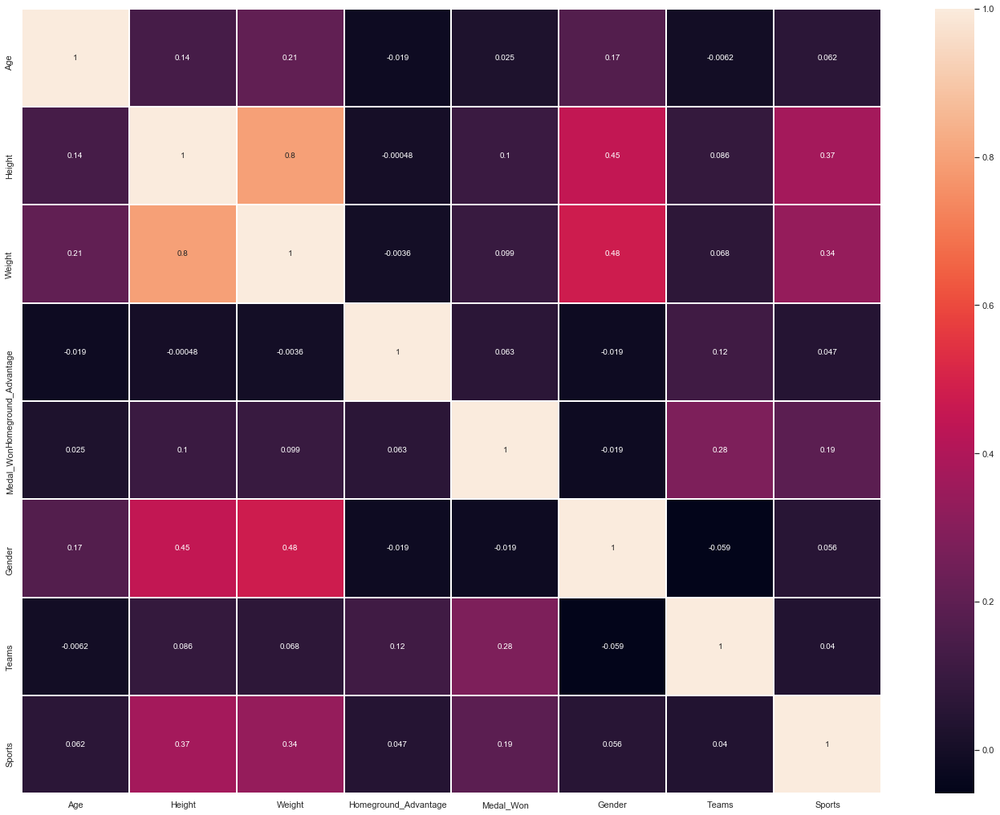

In [29]:
# Probability ratio Encoding
def Probability_Ratio_Encoding(cd):
    
    # Encoding for variable 'Team'
    t_cd = cd.groupby('Team')['Medal_Won'].mean()
    t_cd = pd.DataFrame(t_cd)
    t_cd = t_cd.rename(columns = {'Medal_Won':'Good'})
    t_cd['Bad'] = 1-t_cd.Good
    t_cd['Bad'] = np.where(t_cd['Bad'] == 0,0.00001, t_cd['Bad']) 
    t_cd['Good'] = np.where(t_cd['Good'] == 0,0.00001, t_cd['Good']) 
    t_cd['PR'] = t_cd.Good/t_cd.Bad

    # Encoding for variable 'Sport'
    s_cd = cd.groupby('Sport')['Medal_Won'].mean()
    s_cd = pd.DataFrame(s_cd)
    s_cd = s_cd.rename(columns = {'Medal_Won':'Good'})
    s_cd['Bad'] = 1-s_cd.Good
    s_cd['Bad'] = np.where(s_cd['Bad'] == 0,0.00001, s_cd['Bad']) 
    s_cd['Good'] = np.where(s_cd['Good'] == 0,0.00001, s_cd['Good']) 
    s_cd['PR'] = s_cd.Good/s_cd.Bad
    cd.loc[:,'Teams'] = cd['Team'].map(t_cd['PR']) 
    cd.loc[:,'Sports'] = cd['Sport'].map(s_cd['PR']) 

    # Return encoded data as 'num_adm'
    num_adm = cd.drop(columns=['Team','Sport'])
    return num_adm

# Obtain data from 'adm'
corr_data = adm[['Age','Sex', 'Height', 'Weight', 'Sport', 'Team', 'Homeground_Advantage','Medal_Won']]
cdg = pd.DataFrame(corr_data[corr_data['Sport'].isin(sportslist)])
cdg["Gender"] = np.where(cdg.loc[:, ('Sex')] == 'M',1, 0)
cd = cdg.drop(columns = 'Sex')

# Plot correlation table and heatmap to show correlation
f, axes = plt.subplots(1,1, figsize=(24, 18))
pre_corrs = Probability_Ratio_Encoding(cd).corr()
ax = sb.heatmap(pre_corrs, linewidths = 1, annot = True)
bottom, top = ax.get_ylim()       
ax.set_ylim(bottom + 0.5, top - 0.5)
#plt.savefig('pre.png')
pre_corrs

`Probability_Ratio_Encoding` is similar to `WoE_Encoding`, with the only difference is the only ratio of good and bad probability is used. For each label, we calculate the mean of target=1, that is the probability of being 1 ( P(1) ), and also the probability of the target=0 ( P(0) ). And then, we calculate the ratio P(1)/P(0) and replace the labels by that ratio. We need to add a minimal value with P(0) to avoid any divide by zero scenarios where for any particular category, there is no target=0.

**Conclusion**: 
The `Probability Ratio Encoding`, `Frequency Encoding` and `WoE_Encoding` function similarly as they are able to encode the variables with respect to the `Medal_Won`. This will benefite greatly when showing the correlation between each variables and `Medal_Won`. 

With the `Probability Ratio Encoding` showning a very slight advantage in showing the correlation, it will be chosen to continue with finding the correlation.

### 2.4 Correlation Between Each Variables For Individual Sports

Out of the 22 sport that have more than 300 medal won, we wish to further reduce the number of sports and choose sports that will be able to give a more accurate prediction.

#### 2.4.1 Encode categorical value

In [30]:
# Probability Ratio Encoding for 'Team' only
def Probability_Ratio_Encoding_persport(cd):
    t_cd = cd.groupby('Team')['Medal_Won'].mean()
    t_cd = pd.DataFrame(t_cd)
    t_cd = t_cd.rename(columns = {'Medal_Won':'Good'})
    t_cd['Bad'] = 1-t_cd.Good
    t_cd['Bad'] = np.where(t_cd['Bad'] == 0,0.00001, t_cd['Bad']) 
    t_cd['Good'] = np.where(t_cd['Good'] == 0,0.00001, t_cd['Good']) 
    t_cd['PR'] = t_cd.Good/t_cd.Bad
    cd.loc[:,'Teams'] = cd['Team'].map(t_cd['PR']) 
    
    # Return encoded data as 'num_adm'
    num_adm = cd.drop(columns=['Team','Sport'])
    return num_adm

#### 2.4.2 Plot heatmap

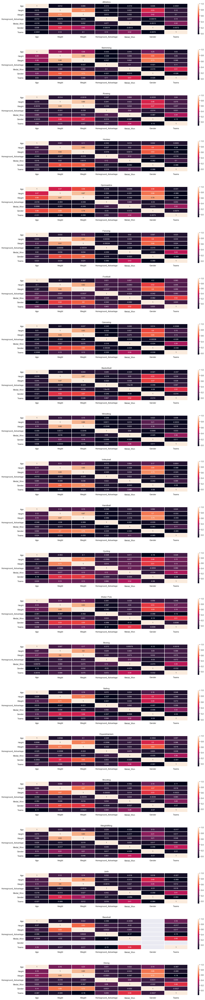

In [31]:
# Display heatmap for each sport with number of medal won greater then 300
f, axes = plt.subplots(22,1, figsize=(20, 100))
plt.subplots_adjust(hspace=.5)

# Obtain data from 'adm'
corr_data = adm[['Age','Sex', 'Height', 'Weight', 'Sport', 'Team', 'Homeground_Advantage','Medal_Won']]
cdg = pd.DataFrame(corr_data[corr_data['Sport'].isin(sportslist)])
cdg["Gender"] = np.where(cdg.loc[:, ('Sex')] == 'M',1, 0)
cd = cdg.drop(columns = 'Sex')

count = 0
for sport in sportslist:
    athletes=pd.DataFrame(cd[(cd['Sport']==sport)])
    pre_s_corrs = Probability_Ratio_Encoding_persport(athletes).corr()
    ax = sb.heatmap(pre_s_corrs, linewidths = 1, annot = True, ax = axes[count])
    bottom, top = ax.get_ylim()       
    ax.set_ylim(bottom + 0.5, top - 0.5)
    ax.set_title(sport)
    #plt.savefig('shearmap.png')
    count+=1

From the heatmap, there are 6 sports that have correlation around 0.5 with the medal won. 
* `Team` have the highest correlation with medal won for most of the sport. 
* `Height` and `Weigth` have very high correlation with each other and `Gender`.
* `Height` and `Weight` have slightly higher correlation with sports.
* The 6 countries are:
    * Swimming
    * Football
    * Waterpolo
    * Baseball
    * Diving

#### 2.4.2 Extract the top absolute correlations within each sport

In [32]:
# Extract only the lower triangle pairs of the correlation matrix
def get_redundant_pairs(dcs):
    pairs_to_drop = set()
    cols = dcs.columns
    for i in range(0, dcs.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

# Extract the top 'n' pairs of the correlation matrix
def get_top_abs_correlations(dcs, n=5):
    au_corr = dcs.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(dcs)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

# Print list
for sport in sportslist:
    athletes=pd.DataFrame(cd[(cd['Sport']==sport)])
    plot = Probability_Ratio_Encoding_persport(athletes).corr()
    print("Top Absolute Correlations for:", sport)
    print(get_top_abs_correlations(plot, 15))
    print()
    count+=1

Top Absolute Correlations for: Athletics
Height                Weight                  0.928913
                      Gender                  0.719842
Weight                Gender                  0.609730
Gender                Teams                   0.461643
Medal_Won             Gender                  0.439617
Height                Homeground_Advantage    0.433415
Weight                Homeground_Advantage    0.428121
Homeground_Advantage  Gender                  0.397098
Medal_Won             Teams                   0.391333
Weight                Medal_Won               0.384291
Height                Medal_Won               0.383965
Age                   Teams                   0.343463
                      Medal_Won               0.321633
                      Height                  0.316158
Weight                Teams                   0.315539
dtype: float64

Top Absolute Correlations for: Swimming
Height                Weight                  0.979541
Weight                G

dtype: float64

Top Absolute Correlations for: Cycling
Height                Weight                  0.910540
Weight                Gender                  0.747645
Height                Gender                  0.715737
Age                   Gender                  0.579333
                      Weight                  0.566054
                      Height                  0.510753
Gender                Teams                   0.463353
Height                Homeground_Advantage    0.424645
Medal_Won             Gender                  0.416946
Weight                Homeground_Advantage    0.390120
Medal_Won             Teams                   0.389569
Height                Medal_Won               0.313440
Homeground_Advantage  Gender                  0.309747
Weight                Medal_Won               0.266169
                      Teams                   0.222758
dtype: float64

Top Absolute Correlations for: Water Polo
Height                Weight                  0.969656
Weight 

#### 2.4.3 Percentage of medal won by different country for each sports

In [33]:
# Display the medal won by each country in each sport using pie chart
country_sports = adm[['Team','Sport','Medal_Won']].copy()
cs = country_sports.groupby(['Sport','Team'])['Medal_Won'].agg('sum').reset_index()
cs.sort_values(['Sport','Team'], axis=0, 
               ascending=True, inplace=True)

count = 0
for sport in sportslist:
    country_sport = cs[(cs['Sport']==sport) & (cs['Medal_Won'] > 0)]
    fig = px.pie(country_sport, values='Medal_Won', names='Team', title=sport)
    fig.show()
    count+=1


Viewing the percentage distribution of the medal won for each country. In the pie chart, the 6 sports with higher correlation with medal won are mostly observed with 1 or a few country showing dominance in the sports. 
* Example: `Swimming`, where `USA` won `36.9%` out of all medals throughout the history.
However, out of the 6 sports there are 3 of them have a huge number of countries winning the same percentage.
* Example: There are more than 15 different countries winning only 1 ~ 3 medal through out the history.
Conclusion: Only the sport with a less even and more significant distribution of percentage medal won per country will be selected to perform Machine Learning and Prediction.
* The Sports are:
    * `Basketball`
    * `Baseball`
    * `Waterpolo`

## Conclusion For Exploratory Analysis

Preparation of data:
* Sampling **x**
* Balancing **x**

Sports selected to continue with machine learning:
* `Basketball`
* `Baseball`
* `Waterpolo`

Variables selected to continue with the machine learning:
* `Age`
* `Height`
* `Weight`
* `Team`

Variables *not* selected to continue with the machine learning:
* `Event`
    * `Event` is a sub class for `Sport`.
    * Way too much event and a large number of event does not have enough data.
* `Season`
    * The majority of the comperition were held during summer.
    * Only a few sports are hosted in winter due to the weather constrain.
    * `Sport` is a sub class of `Season`, removing winter season will not affect the accuracy when performing prediction for each sports. 
* `Gender`
    * There is a stronge correlation between `Gender`, `Height` and `Weight`. The machine learning progeam is able to classify the gender automatically.
    * Not all sports listed in the data have both male and female participants
    * The correlation between `Gender` and `Meda_Won` is very *low*
* `Homeground_Advantage`
    * The correlation between `Homeground_Advantage` and `Meda_Won` is very *low*.

## Balanced VS Imbalanced Data

## 1. Balanced Data

In [34]:
## Obtain data from 'adm'
#corr_data = adm[['Age','Sex', 'Height', 'Weight', 'Sport', 'Team', 'Homeground_Advantage','Medal_Won']]
#cdg = pd.DataFrame(corr_data[corr_data['Sport'].isin(sportslist)])
#cdg["Gender"] = np.where(cdg.loc[:, ('Sex')] == 'M',1, 0)
#cd = cdg.drop(columns = 'Sex')

## Obtain numeric data
#data_final = Probability_Ratio_Encoding(cd)

## Set predictor and responds
#X = data_final.loc[:, data_final.columns != 'Medal_Won']
#y = data_final.loc[:, data_final.columns == 'Medal_Won']

### 1.1 Over-sampling

In [35]:
## Balance the data only using train data
#from imblearn.over_sampling import SMOTE
#os = SMOTE(random_state=0)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
#columns = X_train.columns
#os_data_X,os_data_y=os.fit_sample(X_train, y_train.values.ravel())
#os_data_X = pd.DataFrame(data=os_data_X,columns=columns )
#os_data_y= pd.DataFrame(data=os_data_y,columns=['Medal_Won'])

## Check the numbers of our data
#print("length of oversampled data is ",len(os_data_X))
#print("Number of 0/Medal_Won in oversampled data",len(os_data_y[os_data_y['Medal_Won']==0]))
#print("Number of 1/Medal_Won",len(os_data_y[os_data_y['Medal_Won']==1]))
#print("Proportion of 0/Medal_Won data in oversampled data is ",len(os_data_y[os_data_y['Medal_Won']==0])/len(os_data_X))
#print("Proportion of 1/Medal_Won data in oversampled data is ",len(os_data_y[os_data_y['Medal_Won']==1])/len(os_data_X))

### 1.3 Using Logistic Regression to test analysis

In [36]:
#X=os_data_X
#y=os_data_y['Medal_Won']
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
#logreg = LogisticRegression(max_iter = 1000)
#logreg.fit(X_train, y_train.values.ravel())
#y_pred = logreg.predict(X_test)
#print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))
#from sklearn.metrics import confusion_matrix
#confusion_matrix = confusion_matrix(y_test, y_pred)
#print(confusion_matrix)

### 1.4 Logistic Regression Area Undergraph

In [37]:
#from sklearn.metrics import roc_auc_score
#from sklearn.metrics import roc_curve
#logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
#fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
#plt.figure()
#plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
#plt.plot([0, 1], [0, 1],'r--')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
#plt.xlabel('False Positive Rate')
#plt.ylabel('True Positive Rate')
#plt.title('Balanced Data')
#plt.legend(loc="lower right")
#plt.savefig('Log_ROC')
#plt.show()

## 2 Imbalanced Data

### 2.1 Using Logistic Regression to test analysis

In [38]:
#X = data_final.loc[:, data_final.columns != 'Medal_Won']
#y = data_final.loc[:, data_final.columns == 'Medal_Won']
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
#logreg = LogisticRegression(max_iter = 1000)
#logreg.fit(X_train, y_train.values.ravel())
#y_pred = logreg.predict(X_test)
#print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))
#from sklearn.metrics import confusion_matrix
#confusion_matrix = confusion_matrix(y_test, y_pred)
#print(confusion_matrix)

### 2.2 Logistic Regression Area Undergraph

In [39]:
#from sklearn.metrics import roc_auc_score
#from sklearn.metrics import roc_curve
#logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
#fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
#plt.figure()
#plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
#plt.plot([0, 1], [0, 1],'r--')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
#plt.xlabel('False Positive Rate')
#plt.ylabel('True Positive Rate')
#plt.title('Imbalanced Data')
#plt.legend(loc="lower right")
#plt.savefig('Log_ROC')
#plt.show()

# Section C: Machine Learning, Conclusion and Recommendations
(Done By: Ng Woon Ting Elizabeth)

# Machine Learning 
## 1) Preparing Dataframe to be used in Machine Learning


### 1.1 Extracting data for the chosen sports

In [40]:
#Define sports to be used and extract their respective data
ml_data=pd.concat([adm.loc[(adm['Sport'] == "Baseball") , :],
                   adm.loc[(adm['Sport'] == "Basketball") , :],
                   adm.loc[(adm['Sport'] == "Water Polo") , :]
                  ])  
ml_data["ID"]=ml_data["ID"].astype('category') #The variable ID is a unique number assigned to each individual who participates in the olympics

###  1.2 Encoding Categorical Data with Numeric values

  There are two variables, `Gender`and `Team`that are categorical data. However, the Machine Learning classifiers require numeric data inputs, and hence it is necessary to represent each categorical variables numerically.

#### Label Encoding
Since the variable `Gender` is Binary and Nominal(no order of importance),  Label Encoding is used.

In [41]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

#Add a column to represent gender numerically
le.fit(ml_data["Sex"])
ml_data["Gender_label"]=le.transform(ml_data["Sex"])


In [42]:
ml_data.head()

,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,Team,Medal_Won,Country_Host,Homeground_Advantage,Gender_label
401,371,Shinnosuke Abe,M,21.0,179.0,91.0,JPN,2000 Summer,2000,Summer,Sydney,Baseball,Baseball Men's Baseball,NoMedal,Japan,0,Australia,0,1
402,371,Shinnosuke Abe,M,29.0,179.0,91.0,JPN,2008 Summer,2008,Summer,Beijing,Baseball,Baseball Men's Baseball,NoMedal,Japan,0,China,0,1
462,423,Michael Brent Abernathy,M,22.0,182.0,84.0,USA,2000 Summer,2000,Summer,Sydney,Baseball,Baseball Men's Baseball,Gold,USA,1,Australia,0,1
964,844,"William Edward ""Willie"" Adams",M,19.0,198.0,93.0,USA,1992 Summer,1992,Summer,Barcelona,Baseball,Baseball Men's Baseball,NoMedal,USA,0,Spain,0,1
1158,1005,Neil Isaac Adonis,M,31.0,182.0,93.0,RSA,2000 Summer,2000,Summer,Sydney,Baseball,Baseball Men's Baseball,NoMedal,South Africa,0,Australia,0,1


#### Mean Encoding
On the other hand, there is a substantial number of categories under the variable `Team`. Using the Label Encoder will assign unique integer numbers to each of the many categories. This may assign some form of numberic order of "importance" between the `Team`s, meaning the country labelled with the smallest integer may be treated as inferior to the category with the largest integer assigned. This may form false numerical relationships that will affect the classification models accuracy. 

Hence, we apply Mean Encoding to the Variable `Team` (the representing country).

In [43]:
ml_data["Team_Mean_Enc"]=""

#The For loop then repeats the function for all unique sports within the Dataframe.
for sport in ml_data.Sport.unique():
    mean_encode = (ml_data.loc[(ml_data['Sport'] == sport) , :]).groupby(['Team'])['Medal_Won'].mean() # Returns the mean score for each country
    ml_data.loc[(ml_data['Sport'] == sport) , ["Team_Mean_Enc"]] = ml_data["Team"].map(mean_encode)    # Maps the mean score of the country and team to each row of data
    
ml_data["Team_Mean_Enc"]=ml_data["Team_Mean_Enc"].astype('float64') # Ensures mean encoded values are saved as a numerical dtype
ml_data["Medal_Won"]=ml_data["Medal_Won"].astype('category') # Ensures medal_won is saved as a categorical type



All the categorical variables are now represented numerically. The `ml_data` DataFrame is ready to be used.

### 1.3 Feature Selection

Apart from the conclusions found in exploratory analysis of the data, we also want to further investigate and learn ways to select the features that can best help our prediction. We learnt to use the SelectKBest method, to fit each feature into score function model and return the features according to the k highest scores. In this method, we calculate the chi-square metric between the target and the variable and show the variables with the maximum chi-squared values.

#### SelectKBest Features Method

In [44]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Extract Response and Predictors
y = pd.DataFrame(ml_data['Medal_Won'].astype('category'))
X = pd.DataFrame(ml_data.select_dtypes('number'))

#apply SelectKBest class to extract best features
bestfeatures = SelectKBest(score_func=chi2, k='all')
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Features','Score']  #naming the dataframe columns
print(featureScores.sort_values(by=['Score'], ascending=False))  #print features in order of best to worst

               Features        Score
6         Team_Mean_Enc  1017.382154
2                Weight    22.962718
5          Gender_label     7.159123
1                Height     1.696250
4  Homeground_Advantage     0.871224
0                   Age     0.233598
3                  Year     0.100553


In [45]:
# Define features to be used for Machine Learning
predictors = ['Team_Mean_Enc', 'Weight', 'Gender_label', 'Height']

Based on the Scores for our features, we have selected `Team_Mean_Enc`, `Weight`, `Gender_label` and `Height` for our predictors, and excluded the variables `Age` and `Year`, which have scores that are close to zero.

## 2) Defining Machine Learning Classifiers as a Function
We have chosen 4 Machine Learning methods to explore, namely the Decision Tree Classifier, Random Forest Classifier, Naive Bayes Classifier, as well as Logistic Regression.

As we are predicting the target `Medal_Won` for individual sports, data for each sport has to be individually extracted and then put into our Machine Learning algorithms for prediction. Hence, we are approaching this in such a way where we will define each Machine Learning method within a function. Afterwhich, we will call these functions within a loop function. The loop function will iterate for the three sports, each loop extracting data for the respective sport and passing it through each of the 4 Machine Learning Functions.

### 2.1 Decision Tree 
#### 2.1.1 Decision Tree Classifier


In [46]:
def decision_tree_function(X_train, X_test, y_train, y_test): 
    
    # Import essential models and functions from sklearn
    from sklearn.tree import DecisionTreeClassifier

    # Decision Tree using Train Data
    dectree = DecisionTreeClassifier(max_depth = 10)  # create the decision tree object
    dectree.fit(X_train, y_train)                    # train the decision tree model

    # Predict Response corresponding to Predictors
    y_train_pred_dectree = dectree.predict(X_train)
    y_test_pred_dectree = dectree.predict(X_test)

    # Check the Goodness of Fit (on Train Data)
    print("Model: Decision Tree \nSport:",sport)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Classification Accuracy \t:", dectree.score(X_train, y_train))
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", dectree.score(X_test, y_test))
    print()

    #Calculate True Positive and True Negative Rates.
    tn, fp, fn, tp=confusion_matrix(y_test, y_test_pred_dectree).ravel()
    tpr=tp/(tp+fn) #True P ositive Rate
    tnr=tn/(tn+fp) #True Negative Rate
    print("True Positive Rate \t:", tpr)
    print("True Negative Rate \t:", tnr)
    
    # Plot the two-way Confusion Matrix for train set
    f, axes = plt.subplots(1, 2, figsize=(18, 6))
    heatmap= sb.heatmap(confusion_matrix(y_train, y_train_pred_dectree), 
                        annot = True, fmt=".0f", annot_kws={"size": 18},ax = axes[0])
    bottom, top = heatmap.get_ylim()       
    heatmap.set_ylim(bottom + 0.5, top - 0.5)
    heatmap.set_title("Decision Tree\nConfusion Matrix(Train Set) for {}".format(sport),fontsize=18)
    
    #Plot the two-way Confusion Matrix for test set
    heatmap = sb.heatmap(confusion_matrix(y_test, y_test_pred_dectree), 
           annot = True, fmt=".0f", annot_kws={"size": 18},ax = axes[1])
    bottom, top = heatmap.get_ylim()       
    heatmap.set_ylim(bottom + 0.5, top - 0.5)
    heatmap.set_title('Decision Tree\nConfusion Matrix(Test Set) for {}'.format(sport),fontsize=18)
#     plt.show()
    print("_____________________________________________\n")

    return dectree

#### 2.1.2 Decision Tree Plotter

In [47]:
def dectree_plot (dectree):
    import graphviz
    treedot = export_graphviz(dectree, 
                  feature_names=predictors, 
                  filled=True, 
                  rounded=True, 
                  special_characters= True)
    display(graphviz.Source(treedot))
    print("_____________________________________________\n")


### 2.2 Random Forest 
The random forest algorithm uses a random collection of multiple decision trees, and merges them together to obtain a more stable and accurate prediction. Hence, we wanted to implement this Machine Learning method as better alternative to the Decision Tree Classifier 
#### 2.2.1 Random Forest Classifier

In [48]:
def random_forest_function(X_train, X_test, y_train, y_test):

    #Import Random Forest Classifier
    from sklearn.ensemble import RandomForestClassifier

    # Random Forest Model using Train Data
    rfc = RandomForestClassifier(n_estimators=100, bootstrap = True, max_features = 'sqrt') # create the rfc object
    rfc.fit(X_train, y_train.values.ravel()) # train the decision tree model

    # Predict Response corresponding to Predictors
    y_train_pred_rfc = rfc.predict(X_train)
    y_test_pred_rfc = rfc.predict(X_test)

    # Check the Goodness of Fit (on Train Data)
    print("Model: Random Forest Classifier \nSport:",sport)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Classification Accuracy \t:", rfc.score(X_train, y_train))
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", rfc.score(X_test, y_test))
    print()
    
    #Calculate True Positive and True Negative Rates.
    tn, fp, fn, tp=confusion_matrix(y_test, y_test_pred_rfc).ravel()
    tpr=tp/(tp+fn) #True Positive Rate
    tnr=tn/(tn+fp) #True Negative Rate
    print("True Positive Rate \t:", tpr)
    print("True Negative Rate \t:", tnr)

    ## Plot the two-way Confusion Matrix for train set
    f, axes = plt.subplots(1, 2, figsize=(18, 6))
    heatmap= sb.heatmap(confusion_matrix(y_train, y_train_pred_rfc), 
                        annot = True, fmt=".0f", annot_kws={"size": 18},ax = axes[0])
    bottom, top = heatmap.get_ylim()       
    heatmap.set_ylim(bottom + 0.5, top - 0.5)
    heatmap.set_title("Random Forest\nConfusion Matrix(Train Set) for {}".format(sport),fontsize=18)

    #Plot the two-way Confusion Matrix for test set
    heatmap = sb.heatmap(confusion_matrix(y_test, y_test_pred_rfc), 
                         annot = True, fmt=".0f", annot_kws={"size": 18},ax = axes[1])
    bottom, top = heatmap.get_ylim()       
    heatmap.set_ylim(bottom + 0.5, top - 0.5)
    heatmap.set_title('Random Forest\nConfusion Matrix(Test Set) for {}'.format(sport),fontsize=18)
#     plt.show()
    
    print("_____________________________________________\n")

    return rfc


#### 2.2.2  Random Forest Plotter

In [49]:
def rfc_plot (rfc):
    import graphviz
    treedot = export_graphviz(rfc[0], #this will plot the first tree in the forest
                  feature_names=predictors, 
                  filled=True, 
                  rounded=True, 
                  special_characters = True)
    display(graphviz.Source(treedot))
    print("_____________________________________________\n")


### 2.3 Naive Bayes Classifier
The Naive Bayes Algorithm is noted for its fast computational time useful for small training sets. It works on the assumption that the features are independent and not correlated to each other, and hence if this holds true in the dataset, it may better compare to models such as logistic regression.

Since we have found low correlation in our variables during our exploratory analysis, we wanted to find out how the Naive Bayes Classifier will compare to our other Machine Learning methods.

The Gaussian Naive Bayes algorithm is used for classification, which is meant for variables on a continuous scale as it assumes the likelihood that the features have a Gaussian distribution. Hence, we will not include the `Gender_label`as a predictor and drop it from the dataset before prediction as it is a binary variable.

In [50]:
def naive_bayes_function(X_train, X_test, y_train, y_test):

    from sklearn.naive_bayes import GaussianNB

    X_train.drop(['Gender_label'], axis=1) #Remove gender as a predictor from train set
    X_test.drop(['Gender_label'], axis=1)  #Remove gender as a predictor from test set
    
    gnb = GaussianNB()
    gnb.fit(X_train, y_train.values.ravel())    # Train the model

    # Predict Response corresponding to Predictors
    y_train_pred_gnb = gnb.predict(X_train)
    y_test_pred_gnb = gnb.predict(X_test)

    # Check the Goodness of Fit (on Train Data)
    print("Model: Naive Bayes Classification \nSport:",sport)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Classification Accuracy \t:", gnb.score(X_train, y_train))
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", gnb.score(X_test, y_test))
    print()
    
    #Calculate True Positive and True Negative Rates.
    tn, fp, fn, tp=confusion_matrix(y_test, y_test_pred_gnb).ravel()
    tpr=tp/(tp+fn) #True Positive Rate
    tnr=tn/(tn+fp) #True Negative Rate
    print("True Positive Rate \t:", tpr)
    print("True Negative Rate \t:", tnr)
   
    # Plot the two-way Confusion Matrix for train set
    f, axes = plt.subplots(1, 2, figsize=(18, 6))
    heatmap= sb.heatmap(confusion_matrix(y_train, y_train_pred_gnb), 
                        annot = True, fmt=".0f", annot_kws={"size": 18},ax = axes[0])
    bottom, top = heatmap.get_ylim()       
    heatmap.set_ylim(bottom + 0.5, top - 0.5)
    heatmap.set_title("Naive Bayes\nConfusion Matrix(Train Set) for {}".format(sport),fontsize=18)

    #Plot the two-way Confusion Matrix for test set
    heatmap = sb.heatmap(confusion_matrix(y_test, y_test_pred_gnb), 
           annot = True, fmt=".0f", annot_kws={"size": 18},ax = axes[1])
    bottom, top = heatmap.get_ylim()       
    heatmap.set_ylim(bottom + 0.5, top - 0.5)
    heatmap.set_title('Naive Bayes\nConfusion Matrix(Test Set) for {}'.format(sport),fontsize=18)
#     plt.show()
    print("_____________________________________________\n")
    
    return gnb


### 2.4 Logistic Regression

While algorithms such as decision trees handle data with highly skewed classes and categorical data well, we wish to explore the Logistic Regression Model's performance on our data as well. As much as `Team` is the dominating predictor, our other variables such as Height and Weight are non-skewed, continuous numeric values. Logistic Regression is meant to work well with continuous numeric inputs, hence the reason why we earlier encoded the variable `Team` with meaningful values and observe how the model fairs.

In [51]:
def logistic_regression_function(X_train, X_test, y_train, y_test):
    from sklearn.linear_model import LogisticRegression

    # Reuse the split train and test data from previous part (binary decision tree).

    lr = LogisticRegression(C = 8, solver = 'lbfgs', max_iter = 200)
    lr.fit(X_train, y_train.values.ravel())    # Train on the train partition.

    # Predict Response corresponding to Predictors
    y_train_pred_lr = lr.predict(X_train)
    y_test_pred_lr = lr.predict(X_test)

    # Check the Goodness of Fit (on Train Data)
    print("Model:Logistic Regression \nSport:",sport)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Classification Accuracy \t:", lr.score(X_train, y_train))
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", lr.score(X_test, y_test))
    print()
    
    #Calculate True Positive and True Negative Rates.
    tn, fp, fn, tp=confusion_matrix(y_test, y_test_pred_lr).ravel()
    tpr=tp/(tp+fn)
    tnr=tn/(tn+fp)
    print("True Positive Rate \t:", tpr)
    print("True Negative Rate \t:", tnr)
    
    # Plot the two-way Confusion Matrix for train set
    f, axes = plt.subplots(1, 2, figsize=(18, 6))
    heatmap= sb.heatmap(confusion_matrix(y_train, y_train_pred_lr), 
                        annot = True, fmt=".0f", annot_kws={"size": 18},ax = axes[0])
    bottom, top = heatmap.get_ylim()       
    heatmap.set_ylim(bottom + 0.5, top - 0.5)
    heatmap.set_title("Logistic Regression\nConfusion Matrix(Train Set) for {}".format(sport),fontsize=18)

    #Plot the two-way Confusion Matrix for test set
    heatmap = sb.heatmap(confusion_matrix(y_test, y_test_pred_lr), 
           annot = True, fmt=".0f", annot_kws={"size": 18},ax = axes[1])
    bottom, top = heatmap.get_ylim()       
    heatmap.set_ylim(bottom + 0.5, top - 0.5)
    heatmap.set_title('Logistic Regression\nConfusion Matrix(Test Set) for {}'.format(sport),fontsize=18)
#     plt.show()
    print("_____________________________________________\n")

    
    return lr


## 3) Classification
### 3.1 Fitting Multiple Classification Models Functions for each Sport


*********************************************************
 Baseball
*********************************************************
Model: Decision Tree 
Sport: Baseball
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9132492113564669

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8584905660377359

True Positive Rate 	: 0.8160919540229885
True Negative Rate 	: 0.888
_____________________________________________

Model: Random Forest Classifier 
Sport: Baseball
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9574132492113565

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8537735849056604

True Positive Rate 	: 0.8045977011494253
True Negative Rate 	: 0.888
_____________________________________________

Model: Naive Bayes Classification 
Sport: Baseball
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8485804416403786

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.84

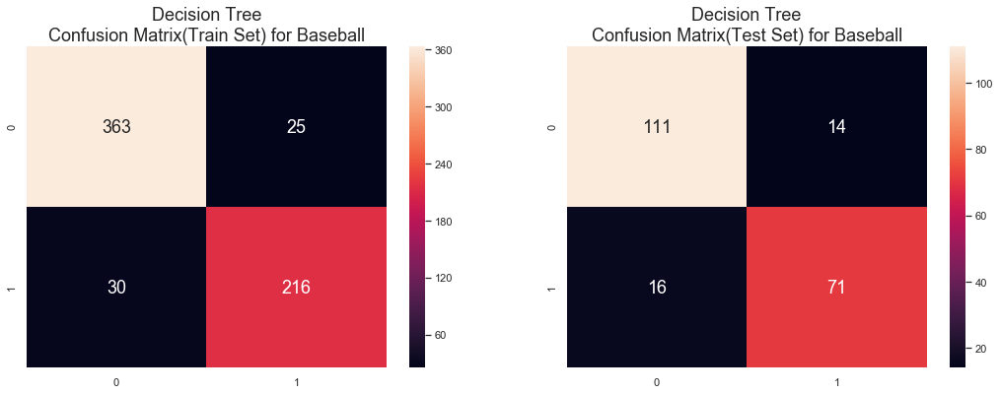

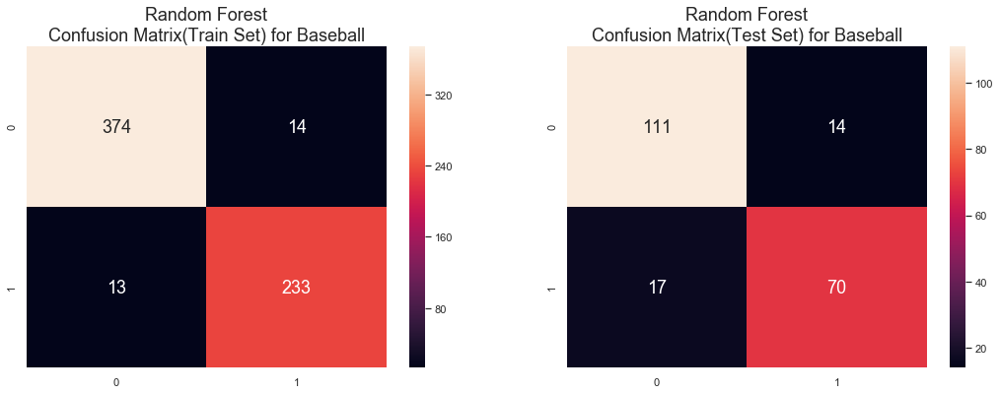

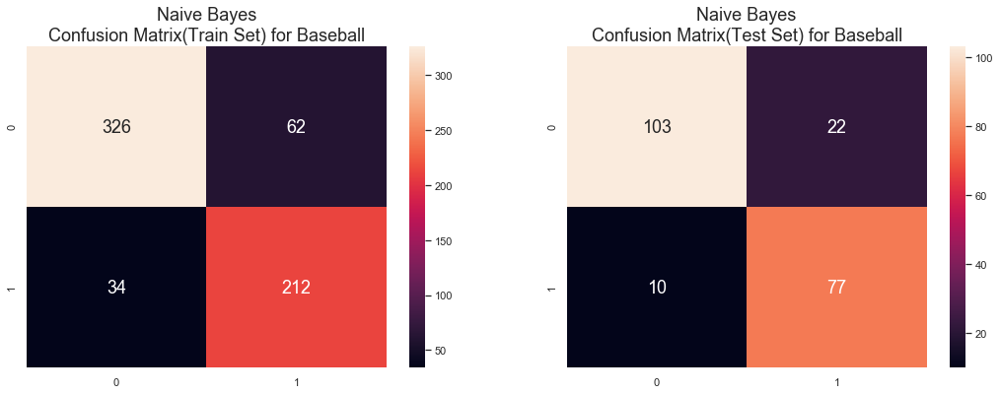

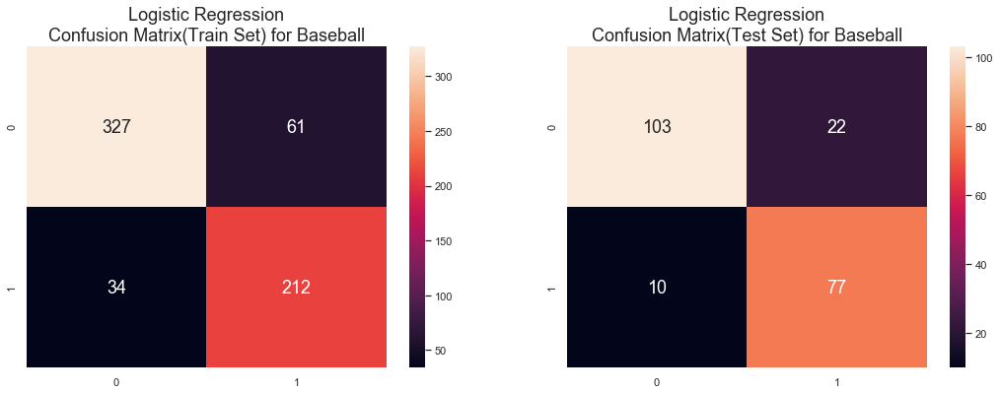

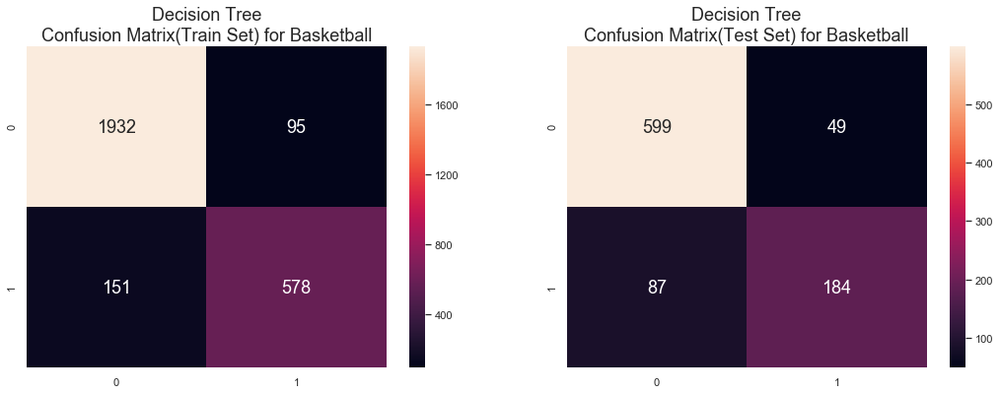

...

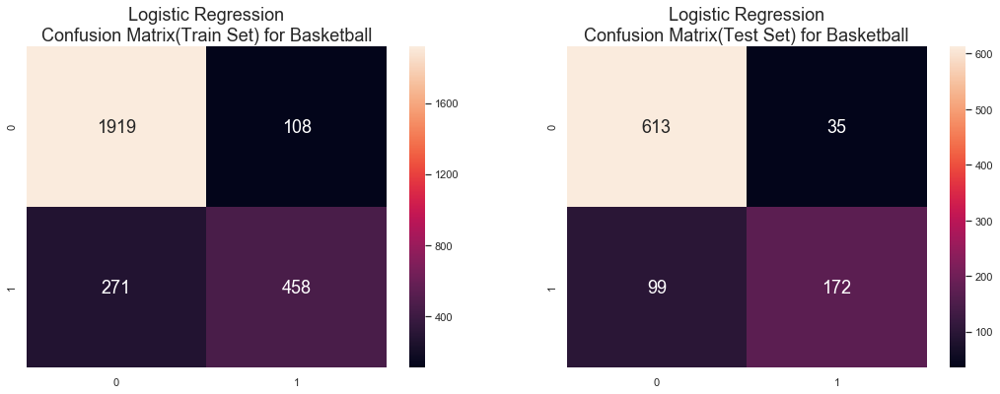

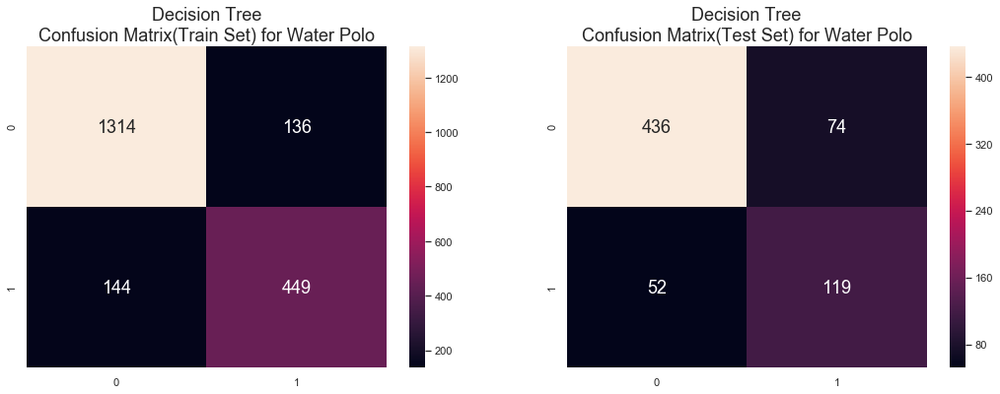

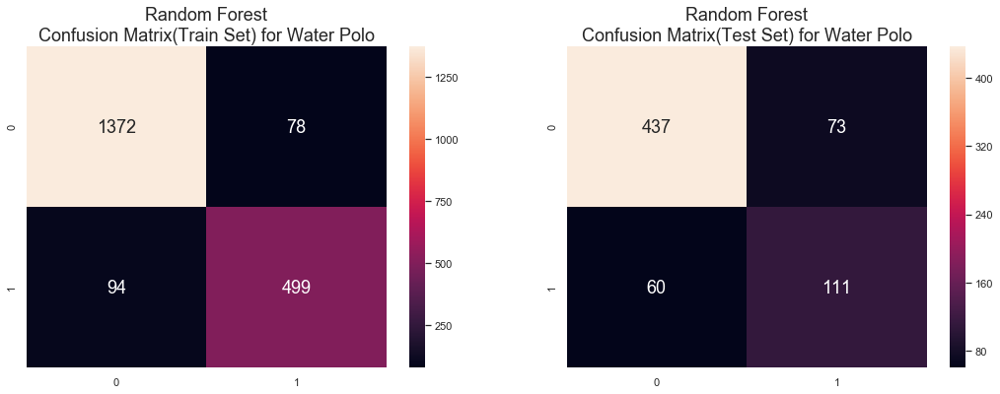

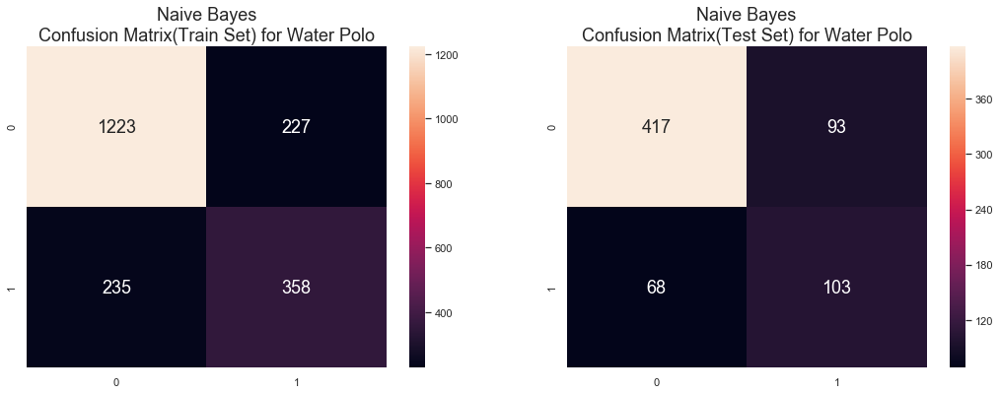

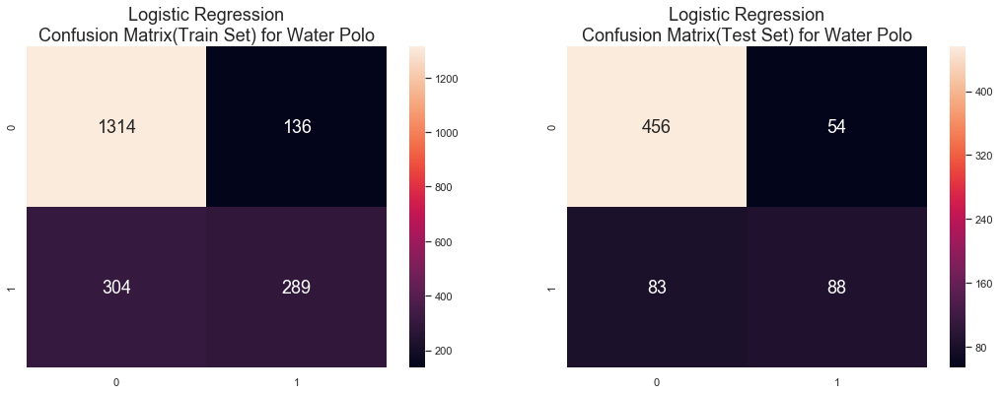

In [52]:
# Import essential models and functions 
from sklearn.model_selection import train_test_split
import joblib 
from sklearn.metrics import confusion_matrix


for sport in ml_data.Sport.unique():
    # Extract Response and Predictors
    sportdata = ml_data.loc[(ml_data['Sport'] == sport) , :]
    y = pd.DataFrame(sportdata['Medal_Won'].astype('category'))
    X = pd.DataFrame(sportdata[predictors])

    # Split the Dataset into Train and Test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)
    
    print("\n*********************************************************\n",sport)
    print("*********************************************************")
    
    #Running machine learning functions with the same dataset for each sport   
    #1.Run Decision Tree Function
    dectree=decision_tree_function(X_train, X_test, y_train, y_test)
#     dectree_plot(dectree) #uncomment this line to plot all the decision trees

    #2.Run Random Forest Function
    rfc=random_forest_function(X_train, X_test, y_train, y_test)
#     rfc_plot(rfc)         ##uncomment this line to plot all the rfc trees
    
    #3.Run Naive Bayes Function
    gnb=naive_bayes_function(X_train, X_test, y_train, y_test)
    
    #4.Logistic Regression
    lr=logistic_regression_function(X_train, X_test, y_train, y_test)
    
    #Save models as a pickle in a file
#     joblib.dump(dectree, '{}_dectree_model.pkl'.format(sport)) 
#     joblib.dump(rfc, '{}_rfc_model.pkl'.format(sport)) 
#     joblib.dump(gnb, '{}_gnb_model.pkl'.format(sport)) 
#     joblib.dump(lr, '{}_lr_model.pkl'.format(sport))     


### 3.2 Result Analysis

##### Goodness of Fit, Classification Accuracy, True Positive Rate(TPR) and True Negative Rate(TNR)
Since the target, `Medal_Won` is consistently biased towards the outcome '0' (no win) in our data, it is also easy for our machines to overfit and hence classify a huge percentage accurately as a '0'. It will cause the Goodness of Fit Accuracy to be high, however it will skew the True Positive rates to be low, and True Negative rates to be high, meaning that the models are overfitting and not doing proper prediction after all. It is important to take into account the TPR and TNR when judging the performance of our prediction models. 

That being said, our models for the selected sports did not face this issue and performed generally well in this aspect. The Classification Accuracies and TNR/TPR for Baseball ranges from 0.7-0.9. For Basketball and Water Polo, the classification Accuracies and TNR are above 0.8, but the TPR ranges from 0.6-0.7 and 0.4-0.6 respectively. 

There may be a stronger correlation between the variables and target, or consistency between variables and outcomes for the sport Baseball as compared to Basketball and Water Polo. 

##### Comparison of Machine Learning Methods

As expected, Random Forest Classification tends to do better than the Decision Tree Classfication, although minimally. This minimal difference could be due to the fact that there is not much variance or instability in the Decision Tree Model to begin with, as well as the fact that there are few features, or less deep decision trees.

For our dataset, the Naive Bayes Model did not do as well as the Decision Tree and Random Forest Models. This could be due to the fact that our data may not be perfectly Gaussian distributed, and our predictors may not be completely independent of each other, lowering the performance of the classifier.

The Logistic Regression Model's performance pales in comparison to the three other Machine Learning Methods, perhaps due to the nature of our data. Our number of samples are relatively small or imbalanced, and numerically, our variables do not have a strong enough correlation with the outcome. 

In conclusion, our best results come from the sport Baseball, and the classification method Random Forest Classification. 
It is possible to predict whether an individual participating in the sport Baseball at the Olympics, with the attributes `Team`, `Weight`, `Gender` and `Height`.

####  (Additional Option) Plotting Individual Decision Trees
If you wish to plot all the decision trees, you may uncomment the respective lines 'dectree_plot(dectree)' and 'rfc_plot(rfc)' in the code above.

However, if you wish to only plot the tree or forest for a particular sport instead, uncomment and run the following two cells. For this to work, please ensure that the section "#Save models as a pickle in a file" in the previous code is NOT commented out.

###### Decision Tree:

In [53]:
 
# sport= 'Baseball' #Change this variable according to the sport you wish to view

# #Load the model from file
# dectree = joblib.load('{}_dectree_model.pkl'.format(sport))  
# import graphviz
# treedot = export_graphviz(dectree, 
#               feature_names=predictors, 
#               filled=True, 
#               rounded=True, 
#               special_characters= True)
# display(graphviz.Source(treedot))



###### Random Forest (Plots one of the trees in the forest)

In [54]:
# sport= 'Baseball' #Change this variable according to the sport you wish to view

# #Load the model from file
# rfc = joblib.load('{}_rfc_model.pkl'.format(sport))  
# import graphviz
# treedot = export_graphviz(rfc[0], #this will plot the first tree in the forest
#               feature_names=predictors, 
#               filled=True, 
# Having run our classifiers, checking the feature importance will tell us which variables were the most useful in our prediction results. We checked               rounded=True, 
#               special_characters = True)
# display(graphviz.Source(treedot))



#### Feature Importance 
Having run our classifiers, checking the feature importance will tell us which variables were the most useful in our prediction results.

Team_Mean_Enc    0.514575
Weight           0.228766
Height           0.213419
Gender_label     0.043240
dtype: float64


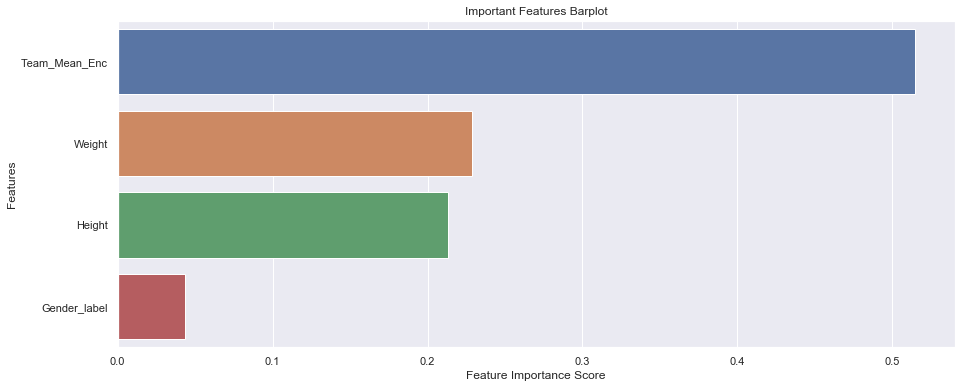

In [55]:
# rfc = joblib.load('Water Polo_rfc_model.pkl')  

feature_imp = pd.Series(rfc.feature_importances_, index = X.columns).sort_values(ascending=False)
print(feature_imp)

fig, axes = plt.subplots(1, 1, figsize=(15,6))
sb.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Important Features Barplot")
plt.show()

`Team_mean_enc` was the most important feature in the example above, followed by `Weight`, `Height` and `Gender_label`

# Conclusion and Recommendations
(Done by: Ng Woon Ting Elizabeth)

* It is not easy to predict if a particular individual will win a medal at the olympics given the current dataset we worked on. Yet, we have also successfully predicted whether an individual will won a medal (Gold, Silver, Bronze) in the Baseball Olympic Event. 


* The Top 4 most important features in predicting if an individual will win a medal in the Baseball Olympics are:
    1. Team/ Country Representing (`Team_mean_enc`)
    2. `Weight` 
    3. `Height`
    4. Gender (`Gender_label`)
* We used 4 different models, in which Random Forest Classfication performed the best, followed by Decision Tree Classification, Naive Bayes Classification, and then Logistic Regression.


* Still, we wish to acknowledge the limitations of our dataset and predictors, for our particular problem statement. 

##### 1. Why we have successful results, and what to note:
As shown in "Feature Importance" above, a strong feature that helped our predictions was `Team_mean_enc`. This Variable was encoded with the assumption that the mean value (number of times a particular country has won a medal/number of times  particlar country has participated), is constant. This statistic, may show trends of which countries have a good track record and hence the assumption that the countries performance will always be of the same standard. This assumption works for prediction since it is generally true that some Teams have consistently dominated particular sports in the olympics as seen in our Exploratory Analysis, hence there is some form of relationship. Still, the variable `Team` is NOT the direct cause and factor as to how individuals will perform and hence whether they will win or not.

##### 2. How can we overcome this? (Recommendations)
With our current dataset, it is limited in being able to predict one's performance in the olympics, as the current variables simply do not determine the outcome. Hence, we would like to suggest possible variables for future development.

For the particular variable `Team` and `Team_mean_enc`, instead of determining the Team's chance at winning based on statistics and assuming that the results of the predecessors will always hold true for a future participant's performance and chance at winning. Perhaps, a more accurate measure would be data and statistics that compare the resources that each Team(country) has invested in the athletes leading up to the olympics. It could be the number of Sports Academies each country has, or the resources and funding given to support the training of their olympics team.


As for individual statistics, the variables in our dataset such as `Height`, `Weight` and `Gender` are not the best predictors there is a wide overlapping variance across those who win a medal and do not.Furthermore, we conclude that it is a poor measure of how well an athlete will perform at the competition itself. More than just physical measurements, we suggest incorporating new data and variables that are measures of Functional Performance and Skills, directly related to the nature of the respective Olympic Sport Events. There are various professional tests statistics for the athleticism or skill of an individual such as Agility Testing, Strength Testing, Sprint Testing, Cardio Testing, Muscle Endurance etc. The combinations of Skills and Athleticism attributes are precisely what Olympians train and prepare themselves to compete against opponents in their respective sports at the olympics. Hence we believe they may have a stronger and direct correlation to whether or not they will win a medal among the rest, and it will be an interesting further development for this project.



## Project Workload Allocation
Section A: Data Cleaning (Goh Sheue Ling)

Section B: Data Preperation, Exploratory Analysis (Wang Jia Rui)

Section C: Introduction, Machine Learning, Conclusion and Recomendations (Ng Woon Ting Elizabeth)